# Imputación con Random forest

## Preparar librerias

In [216]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import random
import warnings
import math
#from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
#from sklearn.preprocessing import Normalizer
from sklearn.metrics import root_mean_squared_error as rmse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
import importlib.util

# Especifica la ruta al archivo del módulo
ruta_al_modulo = './util/auxi.py'

# Importa el módulo
spec = importlib.util.spec_from_file_location("auxi", ruta_al_modulo)
auxi = importlib.util.module_from_spec(spec)
spec.loader.exec_module(auxi)

## Leer datos originales

Hay que leer el dataset original para comparar los datos imputados con los reales

Temperatura

In [217]:
warnings.filterwarnings('ignore', category=SyntaxWarning)  # Porque el \d de \data y \daily lo toma como un valor especial
dataframe_temperatura = pd.read_csv("..\data\daily-minimum-temperatures-in-me.csv", header=0, index_col=0, parse_dates=True)
serie_temperatura = dataframe_temperatura.squeeze('columns')
serie_temperatura = serie_temperatura.resample('D').mean()
serie_temperatura['1984-12-31'] = (serie_temperatura['1984-12-30'] + serie_temperatura['1985-01-01'])/2
serie_temperatura['1988-12-31'] = (serie_temperatura['1988-12-30'] + serie_temperatura['1989-01-01'])/2
serie_temperatura.head()

Date
1981-01-01    20.7
1981-01-02    17.9
1981-01-03    18.8
1981-01-04    14.6
1981-01-05    15.8
Freq: D, Name: Daily minimum temperatures in Melbourne, Australia, 1981-1990, dtype: float64

Cardiovascular

In [218]:
dataframe_cardiovascular = pd.read_csv("..\data\\ads_hour.csv", header=0, index_col=0, parse_dates=True)
serie_cardiovascular = dataframe_cardiovascular.squeeze('columns')
serie_cardiovascular = serie_cardiovascular.astype(float)
serie_cardiovascular.head()

C:\Users\alaba\AppData\Local\Temp\ipykernel_22392\3747356855.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dataframe_cardiovascular = pd.read_csv("..\data\\ads_hour.csv", header=0, index_col=0, parse_dates=True)


Date
2017-08-03 00:00:00    49136.0
2017-08-03 01:00:00    46450.0
2017-08-03 02:00:00    46355.0
2017-08-03 03:00:00    43748.0
2017-08-03 04:00:00    42281.0
Name: ads, dtype: float64

Manchas solares

In [219]:
dataframe_sunspots = pd.read_csv("..\data\monthly-sunspots.csv", header=0, index_col=0, parse_dates=True)
serie_sunspots = dataframe_sunspots.squeeze('columns')
serie_sunspots = serie_sunspots.resample('ME').mean() # Para los meses
serie_sunspots.head()

Month
1749-01-31    58.0
1749-02-28    62.6
1749-03-31    70.0
1749-04-30    55.7
1749-05-31    85.0
Freq: ME, Name: Sunspots, dtype: float64

## Funciones

### Pasar a matriz

In [220]:
def pasar_matrix(lista_vector, lista_matriz):
    lista_matriz_resul = []
    for i in range(len(lista_vector)):
        resul = np.concat((np.array([lista_vector[i]]).T, lista_matriz[i]), axis=1)
        lista_matriz_resul.append(resul)
    return lista_matriz_resul

### Separar train, validacion, test final

In [221]:
def separacion(lista_train_val, lista_test, validation_size = 0.20, seed = 7):
    lista_entrnamiento_X = []
    lista_entrnamiento_Y = []
    lista_entrnamiento_val_X = []
    lista_entrnamiento_val_Y = []
    lista_validacion_X = []
    lista_validacion_Y = []
    lista_test_final_X = []
    lista_test_final_Y = []
    for i in range(len(lista_train_val)):
        matriz_entrenamiento = lista_train_val[i]
        matriz_test = lista_test[i]
        X_train_val = matriz_entrenamiento[:,1:]
        Y_train_val = matriz_entrenamiento[:,:1]
        X_test = matriz_test[:,1:]
        Y_test = matriz_test[:,:1]
        X_train, X_validation, Y_train, Y_validation = train_test_split(X_train_val, Y_train_val, test_size=validation_size, random_state=seed, shuffle=False)
        lista_entrnamiento_X.append(X_train)
        lista_entrnamiento_Y.append(Y_train)
        lista_entrnamiento_val_X.append(X_train_val)
        lista_entrnamiento_val_Y.append(Y_train_val)
        lista_validacion_X.append(X_validation)
        lista_validacion_Y.append(Y_validation)
        lista_test_final_X.append(X_test)
        lista_test_final_Y.append(Y_test)
    return lista_entrnamiento_val_X, lista_entrnamiento_val_Y, lista_entrnamiento_X, lista_entrnamiento_Y, lista_validacion_X, lista_validacion_Y, lista_test_final_X, lista_test_final_Y

### Gridding

In [222]:
def gridding(lista_nombres, lista_entrenamiento_X, lista_entrenamiento_Y, grid):
    df = pd.DataFrame({
        'Nombre': [],
        'Mejor resultado': [],
        'Mejores parametros': [] 
    })
    for i in range(len(lista_nombres)):
        X_train = lista_entrenamiento_X[i]
        Y_train = lista_entrenamiento_Y[i]
        grid_result = grid.fit(X_train, Y_train.ravel())
        nueva_fila = pd.DataFrame({ 'Nombre': [lista_nombres[i]], 'Mejor resultado': [grid_result.best_score_], 'Mejores parametros': [grid_result.best_params_]})
        df = pd.concat([df, nueva_fila], ignore_index=True)
        print(" -> Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
    return df

### RandomForest

#### Generar modelo

In [223]:
def generar_modelo_svm(lista_nombres, lista_entrenamiento_X, lista_entrenamiento_Y, lista_validacion_X, lista_validacion_Y, kernel, c, ep, d):
    dataframe_svm = pd.DataFrame({
        'Dataset': [],
        'RMSE': [],
        'MAE': [],
        #'MAPE': [],
        #'R2': [],
        'BIAS': []
    })
    lista_modelos = []
    model = SVR(kernel=kernel, C=c, epsilon=ep, degree=d)
    lista_series = []
    for i in range(0, len(lista_nombres)):

        X_train = lista_entrenamiento_X[i]
        Y_train = lista_entrenamiento_Y[i]
        X_validacion = lista_validacion_X[i]
        Y_validacion = lista_validacion_Y[i]
         
        # Entrenamos el modelo
        model.fit(X_train, Y_train.ravel())
        serie_svm = model.predict(X_validacion)
        # Calculamos la raiz del error cuadrático medio con las series imputadas con rf
        rmse_svm = rmse(Y_validacion, serie_svm)
        # Calculamos el error medio absoluto con las series imputadas con rf
        mae_svm = mae(Y_validacion, serie_svm)
        # Calculamos el error medio absoluto porcentual con las series imputadas con rf
        #mape_rf = mape(Y_validacion, serie_rf)
        #r2_rf = auxi.r2(Y_validacion, serie_rf)
        # Calculamos el bias con las series imputadas con rf
        bias_svm = auxi.BIAS2(Y_validacion, serie_svm)

        nueva_fila = pd.DataFrame({ 'Dataset': [lista_nombres[i]], 'RMSE': [rmse_svm], 'MAE': [mae_svm], 'BIAS': bias_svm})
        dataframe_svm = pd.concat([dataframe_svm, nueva_fila], ignore_index=True)
        lista_series.append(serie_svm)
        lista_modelos.append(model)
    return dataframe_svm, lista_series, lista_modelos

#### Imputar

In [224]:
def imputar_svm(lista_nombres, lista_validacion_X, lista_validacion_Y, lista_modelos):
    dataframe_svm = pd.DataFrame({
        'Dataset': [],
        'RMSE': [],
        'MAE': [],
        #'MAPE': [],
        #'R2': [],
        'BIAS': []
    })
    lista_series = []
    for i in range(0, len(lista_nombres)):
        
        modelo = lista_modelos[i]
        X_validacion = lista_validacion_X[i]
        Y_validacion = lista_validacion_Y[i]

        serie_svm = modelo.predict(X_validacion)
        # Calculamos la raiz del error cuadrático medio con las series imputadas con rf
        rmse_svm = rmse(Y_validacion, serie_svm)
        # Calculamos el error medio absoluto con las series imputadas con rf
        mae_svm = mae(Y_validacion, serie_svm)
        # Calculamos el error medio absoluto porcentual con las series imputadas con rf
        #mape_rf = mape(Y_validacion, serie_rf)
        #r2_rf = auxi.r2(Y_validacion, serie_rf)
        # Calculamos el bias con las series imputadas con rf
        bias_svm = auxi.BIAS2(Y_validacion, serie_svm)

        nueva_fila = pd.DataFrame({ 'Dataset': [lista_nombres[i]], 'RMSE': [rmse_svm], 'MAE': [mae_svm], 'BIAS': bias_svm})
        dataframe_svm = pd.concat([dataframe_svm, nueva_fila], ignore_index=True)
        lista_series.append(serie_svm)
    return dataframe_svm, lista_series

### Crear lag

In [225]:
def create_lag_features(series, lag=3):
    df = pd.DataFrame(series)
    for i in range(1, lag+1):
        df[f'lag_{i}'] = df[series.name].shift(i)
    #df.dropna(inplace=True)  # Remove rows with NaN values
    return df

### Dataframe metadatos

#### Temperatura

In [226]:
def crear_metadatos_temperatura(serie):
    df = pd.DataFrame(serie)
    años = []
    meses = []
    julio = []
    estaciones = []
    semana = []
    for i in range(0,len(serie)):
        años.append(serie.index[i].year)
        dia = serie.index[i].day
        mes = serie.index[i].month
        meses.append(serie.index[i].month)
        julio.append(serie.index[i].timetuple().tm_yday)
        semana.append(serie.index[i].timetuple().tm_yday/7)
        estacion = 0
        # Determinar la estación según el hemisferio sur
        if (mes == 3 and dia >= 21) or (mes in [4, 5]) or (mes == 6 and dia < 21):
            estacion =  4 # Otoño
        elif (mes == 6 and dia >= 21) or (mes in [7, 8]) or (mes == 9 and dia < 21):
            estacion =  1 # Invierno
        elif (mes == 9 and dia >= 21) or (mes in [10, 11]) or (mes == 12 and dia < 21):
            estacion =  2 # Primavera
        elif (mes == 12 and dia >= 21) or (mes in [1, 2]) or (mes == 3 and dia < 21):
            estacion =  3 # Verano
        estaciones.append(estacion)
    df['año'] = años
    df['mes'] = meses
    df['dia_juliano'] = julio
    df['estacion'] = estaciones
    df['semana'] = semana
    return df

In [227]:
def lista_metadatos_temperatura(lista_series):
    df_metadatos = []
    for serie in lista_series:
        df = crear_metadatos_temperatura(serie)
        df_metadatos.append(df)
    return df_metadatos

#### Cardiovascular

In [228]:
def crear_metadatos_cardiovascular(serie):
    df = pd.DataFrame(serie)
    meses = []
    julio = []
    semana = []
    horas = []
    momento_dia = [] # Noche = 0, mañana = 1, mediodia = 2, tarde = 3
    for i in range(0,len(serie)):
        meses.append(serie.index[i].month)
        julio.append(serie.index[i].timetuple().tm_yday)
        horas.append(serie.index[i].hour)
        momento_dia.append(serie.index[i].hour/6)
        semana.append(serie.index[i].timetuple().tm_yday/7)
    df['mes'] = meses
    df['semana'] = semana
    df['dia_juliano'] = julio
    df['hora'] = horas
    df['momento_del_dia'] = momento_dia
    return df

In [229]:
def lista_metadatos_cardiovascular(lista_series):
    df_metadatos = []
    for serie in lista_series:
        df = crear_metadatos_cardiovascular(serie)
        df_metadatos.append(df)
    return df_metadatos

#### Sunspots

In [230]:
def crear_metadatos_sunspots(serie):
    df = pd.DataFrame(serie)
    años = []
    meses = []
    estaciones = []
    lustros = []
    decadas = []
    for i in range(0,len(serie)):
        años.append(serie.index[i].year)
        dia = serie.index[i].day
        mes = serie.index[i].month
        meses.append(serie.index[i].month)
        lustros.append(round(serie.index[i].year/5))
        decadas.append(round(serie.index[i].year/10))
        estacion = 0
        # Determinar la estación según el hemisferio sur
        if (mes == 3 and dia >= 21) or (mes in [4, 5]) or (mes == 6 and dia < 21):
            estacion =  4 # Otoño
        elif (mes == 6 and dia >= 21) or (mes in [7, 8]) or (mes == 9 and dia < 21):
            estacion =  1 # Invierno
        elif (mes == 9 and dia >= 21) or (mes in [10, 11]) or (mes == 12 and dia < 21):
            estacion =  2 # Primavera
        elif (mes == 12 and dia >= 21) or (mes in [1, 2]) or (mes == 3 and dia < 21):
            estacion =  3 # Verano
        estaciones.append(estacion)
    df['año'] = años
    df['mes'] = meses
    df['estacion'] = estaciones
    df['lustro'] = lustros
    df['decada'] = decadas
    return df

In [231]:
def lista_metadatos_sunspots(lista_series):
    df_metadatos = []
    for serie in lista_series:
        df = crear_metadatos_sunspots(serie)
        df_metadatos.append(df)
    return df_metadatos

### Recuperar valores

In [232]:
def recuperar_valores(lista_original, lista_imputada):
    lista_resultado = []
    for i in range(len(lista_original)):
        aux = lista_original[i].copy()
        indices = aux[aux.isna()].index
        k = 0
        for j in indices:
            aux.loc[j] = lista_imputada[i][:,0:1][k][0]
            k += 1
        lista_resultado.append(aux)
    return lista_resultado

## Listar

In [233]:
lista_series_temperatura, lista_nombres_temperatura = auxi.leer_series_nombres('..\miss_valued_data_temperatura\\')
lista_series_cardiovascular, lista_nombres_cardiovascular = auxi.leer_series_nombres('..\miss_valued_data_cardiovascular\\')
lista_series_sunspots,lista_nombres_sunspots = auxi.leer_series_nombres('..\miss_valued_data_manchas_solares\\')

## Generar datasets metadatos

In [234]:
lista_df_temperatura = lista_metadatos_temperatura(lista_series_temperatura)
df_original_temperatura = crear_metadatos_temperatura(serie_temperatura)
lista_df_sunspots = lista_metadatos_sunspots(lista_series_sunspots)
df_original_sunspots = crear_metadatos_sunspots(serie_sunspots)
lista_df_cardiovascular = lista_metadatos_cardiovascular(lista_series_cardiovascular)
df_original_cardiovascular = crear_metadatos_cardiovascular(serie_cardiovascular)

## Obtencion datos test final

In [235]:
lista_temperatura_final_test = auxi.obtencion_datos_test_final_matrix(lista_df_temperatura, df_original_temperatura)
lista_cardiovascular_final_test = auxi.obtencion_datos_test_final_matrix(lista_df_cardiovascular, df_original_cardiovascular)
lista_sunspots_final_test = auxi.obtencion_datos_test_final_matrix(lista_df_sunspots, df_original_sunspots)

## Separar train y test final

In [236]:
lista_df_temperatura_entrenamiento, lista_df_temperatura_para_imputar = auxi.train_test_matrix(lista_df_temperatura)
lista_df_cardiovascular_entrenamiento, lista_df_cardiovascular_para_imputar = auxi.train_test_matrix(lista_df_cardiovascular)
lista_df_sunspots_entrenamiento, lista_df_sunspots_para_imputar = auxi.train_test_matrix(lista_df_sunspots)

## Escalar datos

In [237]:
lista_matriz_temperatura_escaladas, lista_temperatura_final_test_escalada, lista_scalers_temperatura = auxi.escalar_matrix(lista_df_temperatura_entrenamiento, lista_temperatura_final_test, MinMaxScaler())
lista_matriz_sunspots_escaladas, lista_sunspots_final_test_escalada, lista_scalers_sunspots = auxi.escalar_matrix(lista_df_sunspots_entrenamiento, lista_sunspots_final_test, MinMaxScaler())
lista_matriz_cardiovascular_escaladas, lista_cardiovascular_final_test_escalada, lista_scalers_cardiovascular = auxi.escalar_matrix(lista_df_cardiovascular_entrenamiento, lista_cardiovascular_final_test, MinMaxScaler())

## Separar train y validation 80-20

In [238]:
lista_temperatura_train_val_X, lista_temperatura_train_val_Y, lista_temperatura_train_X, lista_temperatura_train_Y, lista_temperatura_validacion_X, lista_temperatura_validacion_Y, lista_temperatura_test_final_X, lista_temperatura_test_final_Y = separacion(lista_matriz_temperatura_escaladas, lista_temperatura_final_test_escalada)
lista_sunspots_train_val_X, lista_sunspots_train_val_Y, lista_sunspots_train_X, lista_sunspots_train_Y, lista_sunspots_validacion_X, lista_sunspots_validacion_Y, lista_sunspots_test_final_X, lista_sunspots_test_final_Y = separacion(lista_matriz_sunspots_escaladas, lista_sunspots_final_test_escalada)
lista_cardiovascular_train_val_X, lista_cardiovascular_train_val_Y, lista_cardiovascular_train_X, lista_cardiovascular_train_Y, lista_cardiovascular_validacion_X, lista_cardiovascular_validacion_Y, lista_cardiovascular_test_final_X, lista_cardiovascular_test_final_Y = separacion(lista_matriz_cardiovascular_escaladas, lista_cardiovascular_final_test_escalada)

## Establecer valores entrenamiento

In [239]:
num_folds = 10
num_repeats = 3
seed = 7
scoring = 'neg_root_mean_squared_error'
repeatedKfold = RepeatedKFold(n_splits=num_folds, n_repeats = num_repeats, random_state=seed)
param_grid = dict(kernel=['linear', 'poly', 'rbf','sigmoid'], C=[x/10.0 for x in range(8, 16, 2)], degree=range(2,3,1), epsilon=[x/100.0 for x in range(8, 12, 1)])
grid = GridSearchCV(estimator=SVR(), param_grid=param_grid, scoring=scoring, cv=repeatedKfold)

## Busqueda de hiper-parámetros

### Sliding window (revisar)

In [240]:
#df_temperatura_lag = create_lag_features(series_temperatura_escaladas[0], 50)

In [241]:
#df_entrenamiento = df_temperatura_lag[df_temperatura_lag[series_temperatura_escaladas[0].name].isna()==False]
#df_test = df_temperatura_lag[df_temperatura_lag[series_temperatura_escaladas[0].name].isna()]

In [242]:
#Y_test = serie_original_temperatura_escalada[df_temperatura_lag[df_temperatura_lag[series_temperatura_escaladas[0].name].isna()].index]

In [243]:
#Y_test

In [244]:
#X_train = df_entrenamiento[['lag_1', 'lag_2', 'lag_3']]
#Y_train = df_entrenamiento[series_temperatura_entrenamiento[0].name]
#X_test = df_test[['lag_1', 'lag_2', 'lag_3']]
#Y_test = df_test[series_temperatura_entrenamiento[0].name]

In [245]:
#result_rf_e = cross_val_score(RandomForestRegressor(), X, Y, cv=kfold, scoring=scoring)
#print(result_rf_e.mean(), result_rf_e.std())

In [246]:
#model = RandomForestRegressor()
#model.fit(X_train, Y_train)
#serie_rf = model.predict(X_test)

In [247]:
#serie_rf

In [248]:
'''
suma=0
for i in range(0,len(Y_test)):
    suma += (Y_test.iloc[i] - serie_rf[i])**2
suma = math.sqrt(suma/len(Y_test))'
'''

"\nsuma=0\nfor i in range(0,len(Y_test)):\n    suma += (Y_test.iloc[i] - serie_rf[i])**2\nsuma = math.sqrt(suma/len(Y_test))'\n"

In [249]:
#suma

In [250]:
#dataframe_temperatura_imputada, lista_series_temperatura_imputada = imputar_rf(serie_temperatura_test, series_temperatura_entrenamiento, series_temperatura_test, 100, series_temperatura_escaladas)

### Temperatura

In [251]:
resultados_gridding_temperatura = gridding(lista_nombres_temperatura, lista_temperatura_train_X, lista_temperatura_train_Y, grid)

 -> Best: -0.103643 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.104075 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.104426 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.103974 using {'C': 1.4, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.103922 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.104726 using {'C': 1.4, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.104216 using {'C': 1.4, 'degree': 2, 'epsilon': 0.09, 'kernel': 'rbf'}
 -> Best: -0.103871 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.103143 using {'C': 1.4, 'degree': 2, 'epsilon': 0.1, 'kernel': 'rbf'}
 -> Best: -0.103079 using {'C': 1.4, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.102564 using {'C': 1.4, 'degree': 2, 'epsilon': 0.09, 'kernel': 'rbf'}
 -> Best: -0.102673 using {'C': 1.4, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'

### Cardiovascular

In [252]:
resultados_gridding_cardiovascular = gridding(lista_nombres_cardiovascular, lista_cardiovascular_train_X, lista_cardiovascular_train_Y, grid)

 -> Best: -0.060043 using {'C': 1.2, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.058968 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.059790 using {'C': 1.4, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.054192 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.056876 using {'C': 1.0, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.055312 using {'C': 1.0, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.059606 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.060744 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.062107 using {'C': 1.2, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.059606 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.060744 using {'C': 0.8, 'degree': 2, 'epsilon': 0.08, 'kernel': 'rbf'}
 -> Best: -0.062107 using {'C': 1.2, 'degree': 2, 'epsilon': 0.08, 'kernel':

### Manchas solares

In [253]:
resultados_gridding_sunspots = gridding(lista_nombres_sunspots, lista_sunspots_train_X, lista_sunspots_train_Y, grid)

 -> Best: -0.151296 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.150519 using {'C': 1.4, 'degree': 2, 'epsilon': 0.09, 'kernel': 'rbf'}
 -> Best: -0.150815 using {'C': 1.4, 'degree': 2, 'epsilon': 0.09, 'kernel': 'rbf'}
 -> Best: -0.137929 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.138660 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.139322 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.146919 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.145913 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}
 -> Best: -0.147569 using {'C': 1.4, 'degree': 2, 'epsilon': 0.11, 'kernel': 'rbf'}


## Generar modelo y comprobar su error

Entrenamos con los de entrenamiento y comprobamos con los de validacion, esto nos dara un valor de error del modelo final.

In [257]:
dataframe_temperatura_imputada, lista_series_temperatura_imputada, lista_modelos_temperatura = generar_modelo_svm(lista_nombres_temperatura, lista_temperatura_train_X, lista_temperatura_train_Y, lista_temperatura_validacion_X, lista_temperatura_validacion_Y, kernel='rbf', d=2, c=1.4, ep=0.1)
dataframe_cardiovascular_imputada, lista_series_cardiovascular_imputada, lista_modelos_cardiovascular = generar_modelo_svm(lista_nombres_cardiovascular, lista_cardiovascular_train_X, lista_cardiovascular_train_Y, lista_cardiovascular_validacion_X, lista_cardiovascular_validacion_Y, kernel='rbf', d=2, c=0.8, ep=0.08)
dataframe_sunspots_imputada, lista_series_sunspots_imputada, lista_modelos_sunspots = generar_modelo_svm(lista_nombres_sunspots, lista_sunspots_train_X, lista_sunspots_train_Y, lista_sunspots_validacion_X, lista_sunspots_validacion_Y, kernel='rbf', d=2, c=1.4, ep=0.11)
dataframe_general_imputada = pd.concat([dataframe_temperatura_imputada, dataframe_cardiovascular_imputada, dataframe_sunspots_imputada], ignore_index=True)
dataframe_general_imputada

,Dataset,RMSE,MAE,BIAS
0,min_temperature_bateria_10.csv,0.139161,0.113860,-0.077168
1,min_temperature_bateria_15.csv,0.129962,0.104638,-0.064558
2,min_temperature_bateria_20.csv,0.139625,0.114230,-0.097949
3,min_temperature_error_medida_10.csv,0.132270,0.108504,-0.078254
4,min_temperature_error_medida_15.csv,0.130392,0.106911,-0.072071
5,min_temperature_error_medida_20.csv,0.130136,0.105668,-0.056631
6,min_temperature_interferencias_10.csv,0.131417,0.107559,-0.072103
7,min_temperature_interferencias_15.csv,0.141453,0.116936,-0.091599
8,min_temperature_interferencias_20.csv,0.137971,0.113430,-0.094696
9,min_temperature_mix_10.csv,0.130884,0.106924,-0.073046


## Probar el modelo

In [259]:
dataframe_temperatura_imputada_final, lista_series_temperatura_imputada_final = imputar_svm(lista_nombres_temperatura, lista_temperatura_test_final_X, lista_temperatura_test_final_Y, lista_modelos_temperatura)
dataframe_sunspots_imputada_final, lista_series_sunspots_imputada_final = imputar_svm(lista_nombres_sunspots, lista_sunspots_test_final_X, lista_sunspots_test_final_Y, lista_modelos_sunspots)
dataframe_cardiovascular_imputada_final, lista_series_cardiovascular_imputada_final = imputar_svm(lista_nombres_cardiovascular, lista_cardiovascular_test_final_X, lista_cardiovascular_test_final_Y, lista_modelos_cardiovascular)
dataframe_general_imputada_final = pd.concat([dataframe_temperatura_imputada_final, dataframe_cardiovascular_imputada_final, dataframe_sunspots_imputada_final], ignore_index=True)
dataframe_general_imputada_final

,Dataset,RMSE,MAE,BIAS
0,min_temperature_bateria_10.csv,0.112058,0.089203,-0.025435
1,min_temperature_bateria_15.csv,0.109521,0.087224,-0.024545
2,min_temperature_bateria_20.csv,0.113425,0.089748,-0.020656
3,min_temperature_error_medida_10.csv,0.112688,0.089851,-0.013829
4,min_temperature_error_medida_15.csv,0.111794,0.089660,-0.014969
5,min_temperature_error_medida_20.csv,0.110100,0.087758,-0.013678
6,min_temperature_interferencias_10.csv,0.107971,0.084486,-0.009720
7,min_temperature_interferencias_15.csv,0.111334,0.088407,-0.020289
8,min_temperature_interferencias_20.csv,0.112415,0.089182,-0.010356
9,min_temperature_mix_10.csv,0.114548,0.088893,-0.018939


## Desescalamos

In [260]:
lista_df_temperatura_imputada_final = pasar_matrix(lista_series_temperatura_imputada_final, lista_temperatura_test_final_X)
lista_df_cardiovascular_imputada_final = pasar_matrix(lista_series_cardiovascular_imputada_final, lista_cardiovascular_test_final_X)
lista_df_sunspots_imputada_final = pasar_matrix(lista_series_sunspots_imputada_final, lista_sunspots_test_final_X)

In [261]:
np.set_printoptions(suppress=True)
lista_df_temperatura_imputada_final = auxi.desescalar_matrix(lista_scalers_temperatura, lista_df_temperatura_imputada_final)
lista_df_cardiovascular_imputada_final = auxi.desescalar_matrix(lista_scalers_cardiovascular, lista_df_cardiovascular_imputada_final)
lista_df_sunspots_imputada_final = auxi.desescalar_matrix(lista_scalers_sunspots, lista_df_sunspots_imputada_final)

## Recuperamos valores

In [262]:
lista_serie_recuperada_temperatura = recuperar_valores(lista_series_temperatura, lista_df_temperatura_imputada_final)
lista_serie_recuperada_cardiovascular = recuperar_valores(lista_series_cardiovascular, lista_df_cardiovascular_imputada_final)
lista_serie_recuperada_sunspots = recuperar_valores(lista_series_sunspots, lista_df_sunspots_imputada_final)

## Graficos

### Temperatura

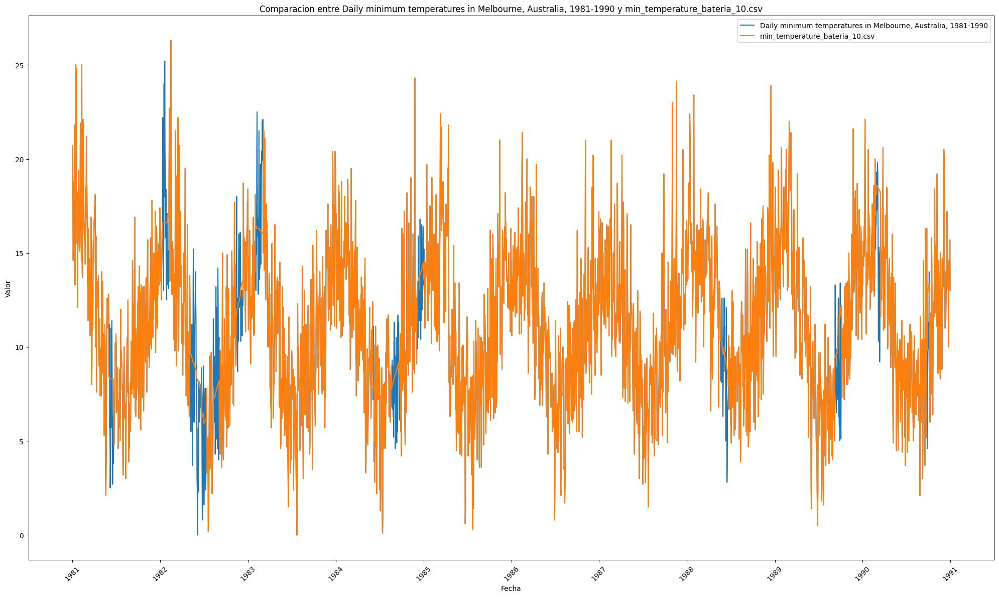

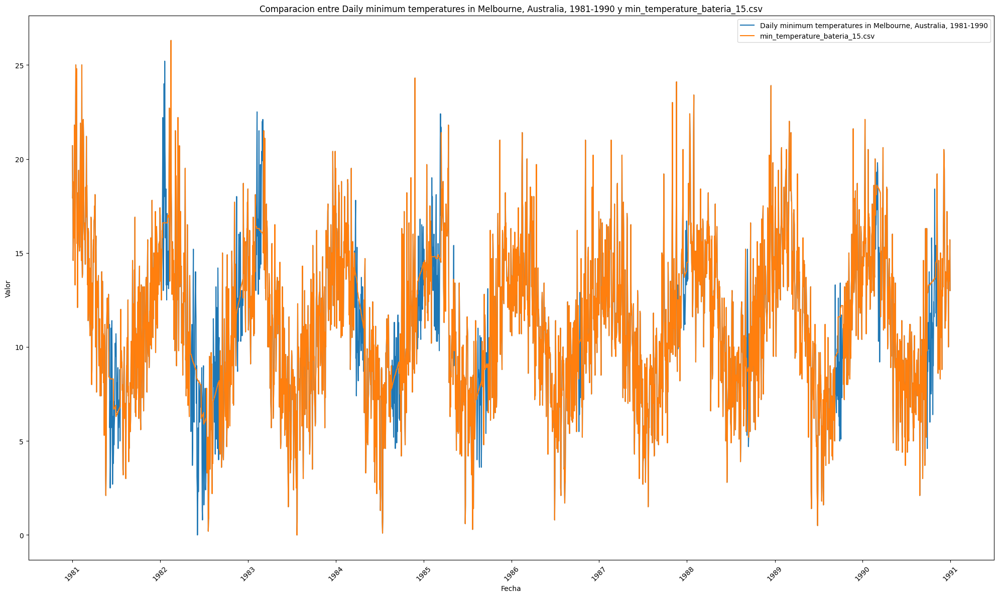

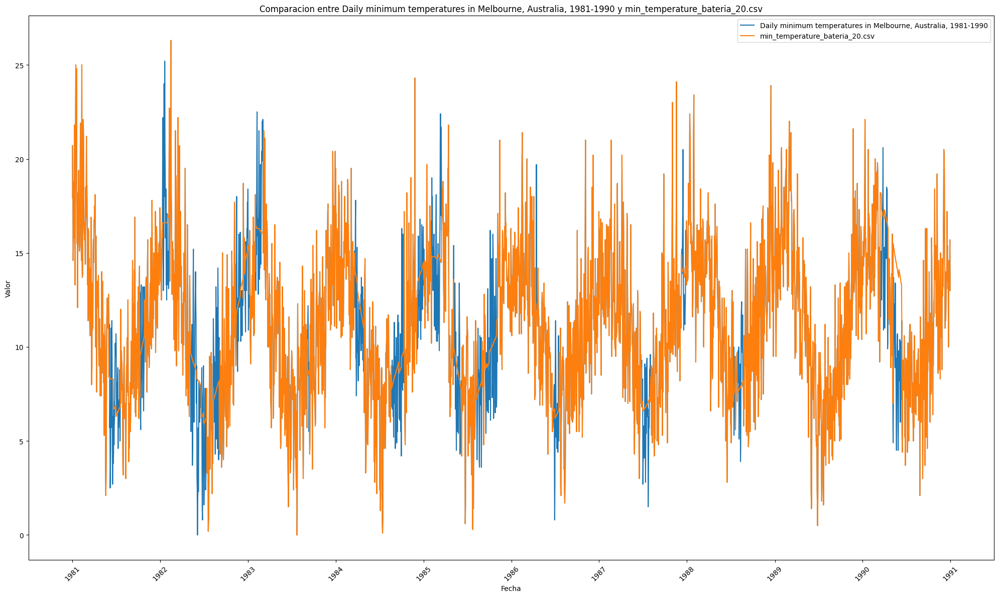

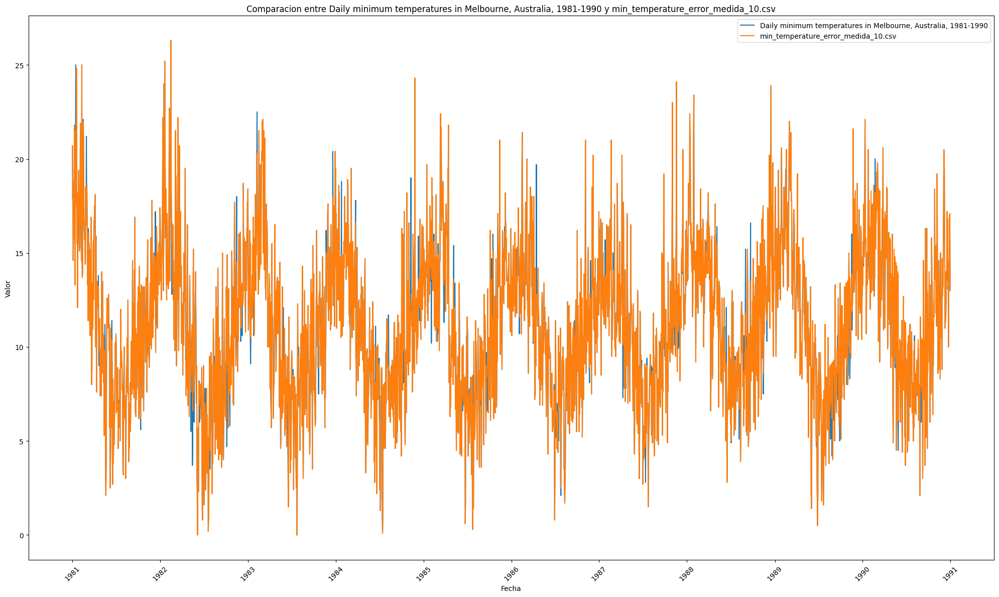

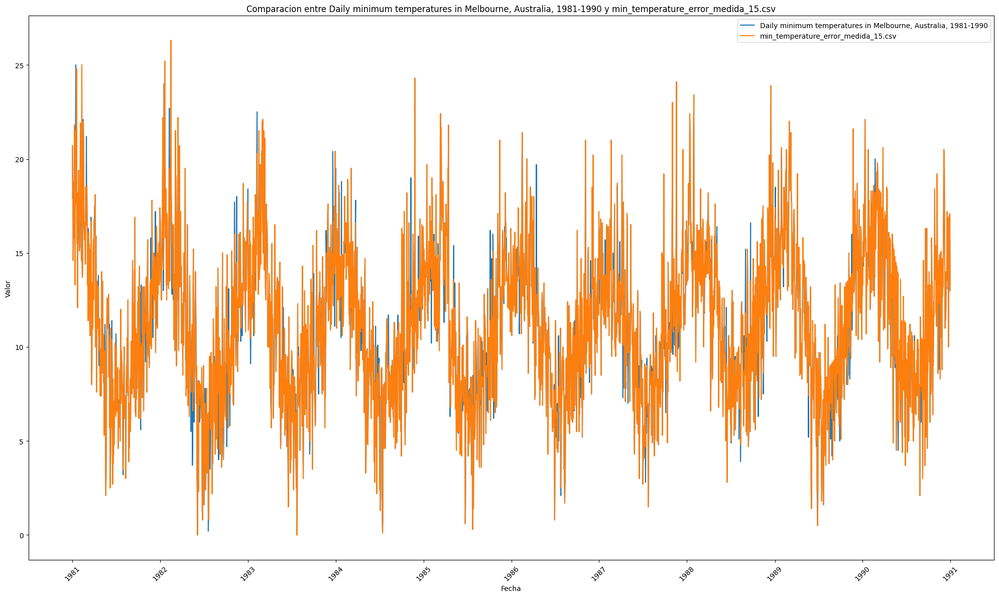

...

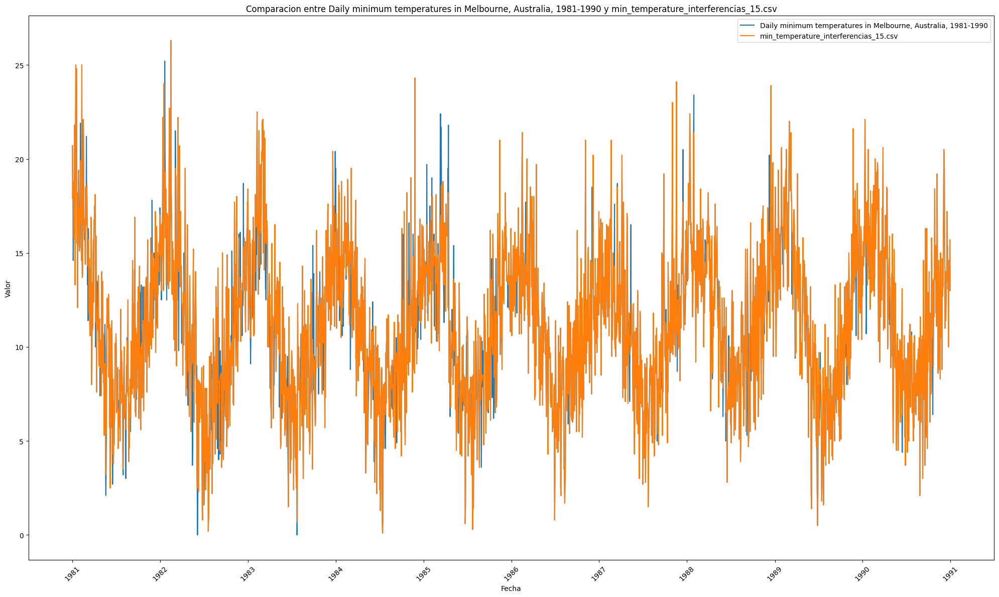

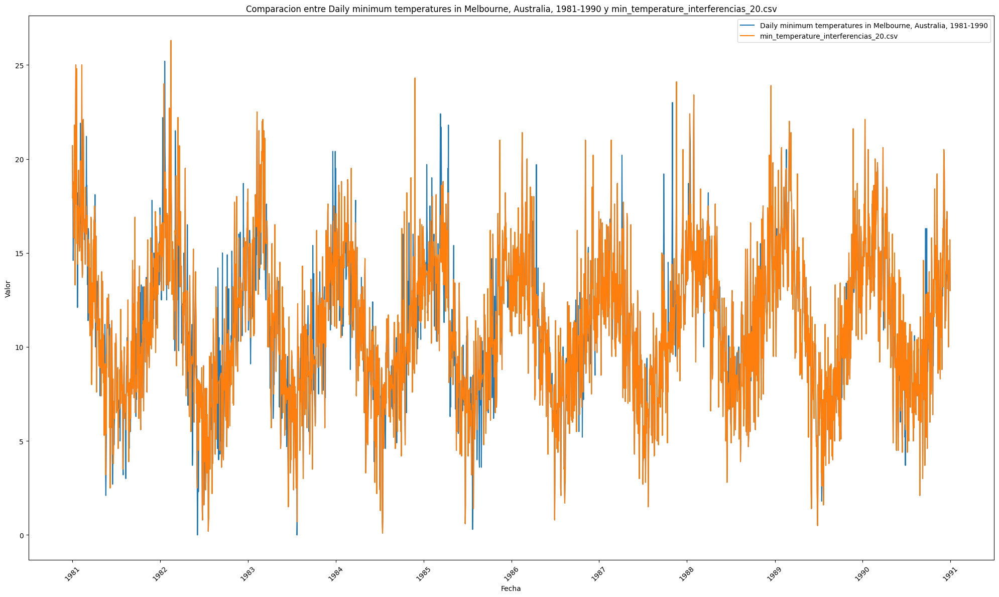

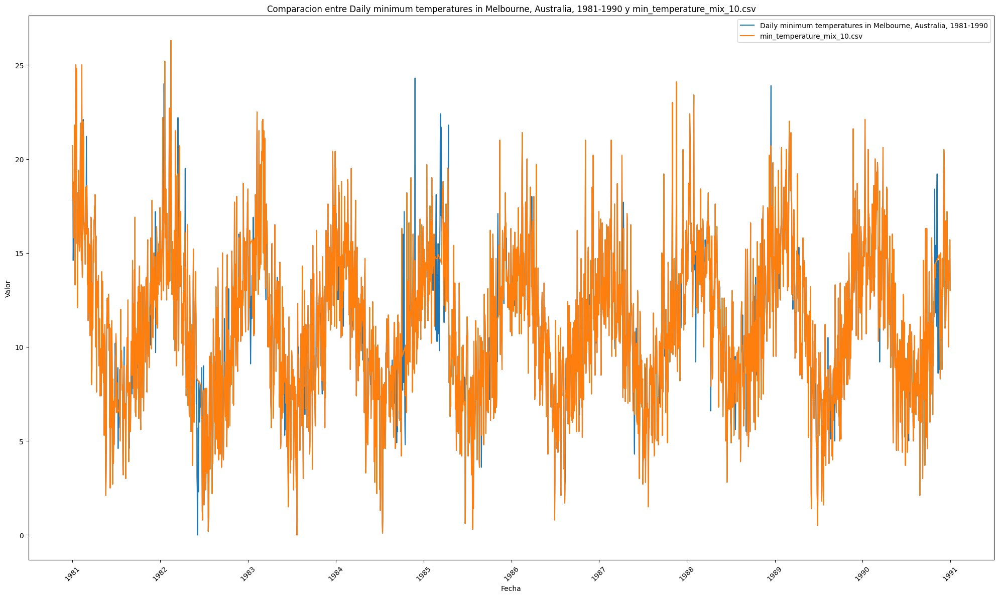

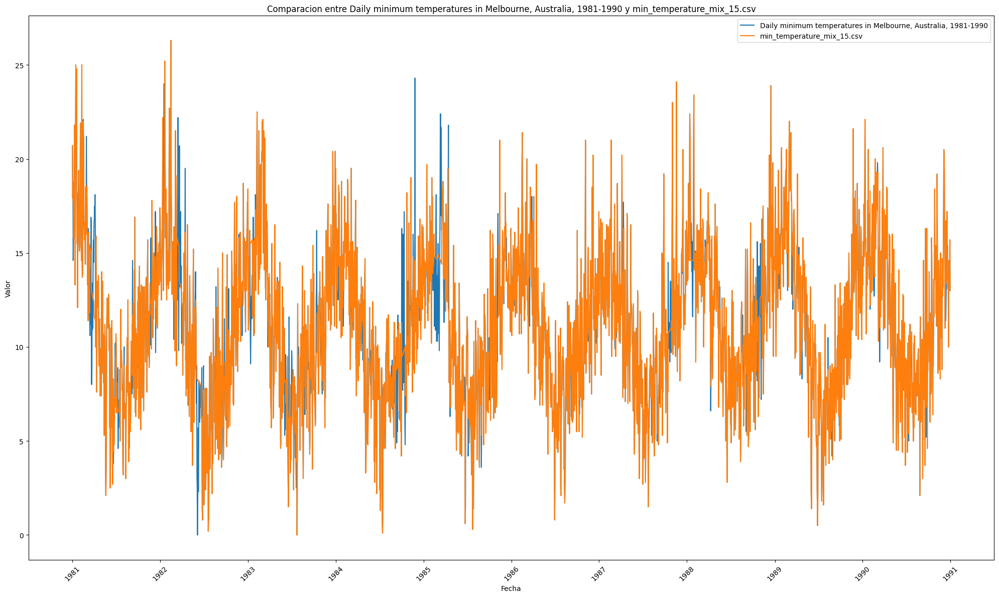

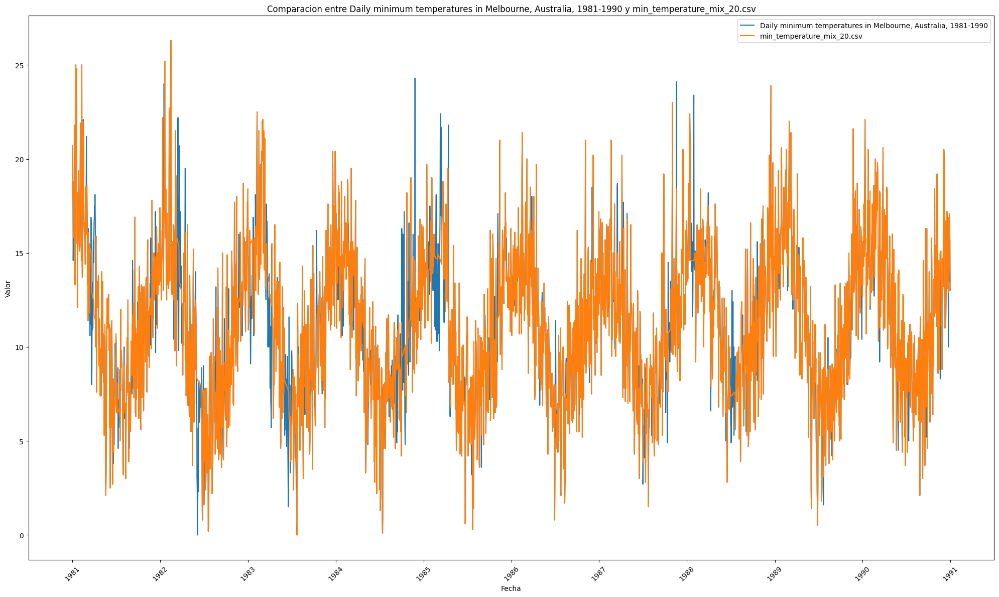

In [263]:
auxi.graficar_comparacion(serie_temperatura, lista_serie_recuperada_temperatura)

### Cardiovascular

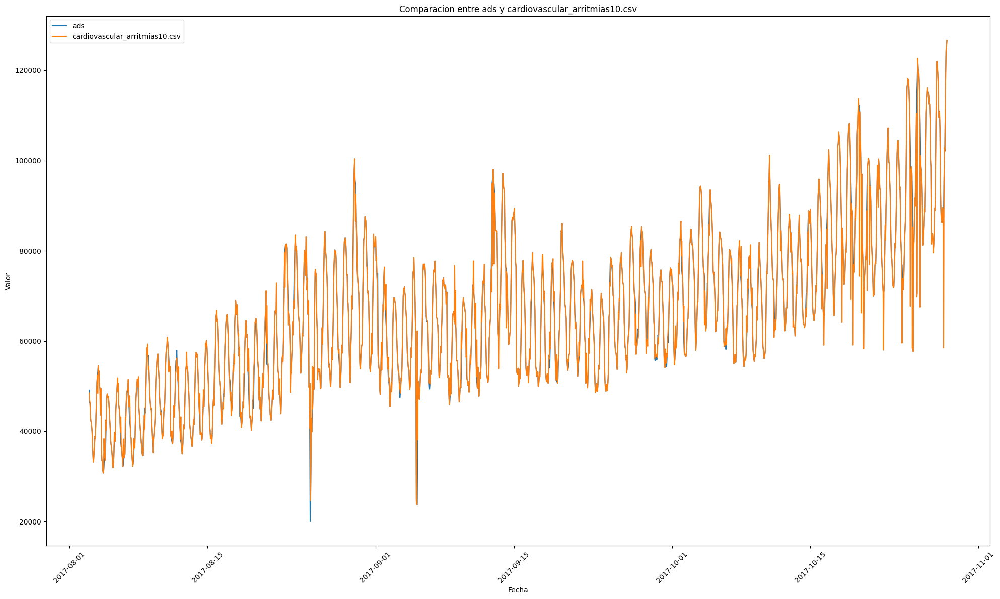

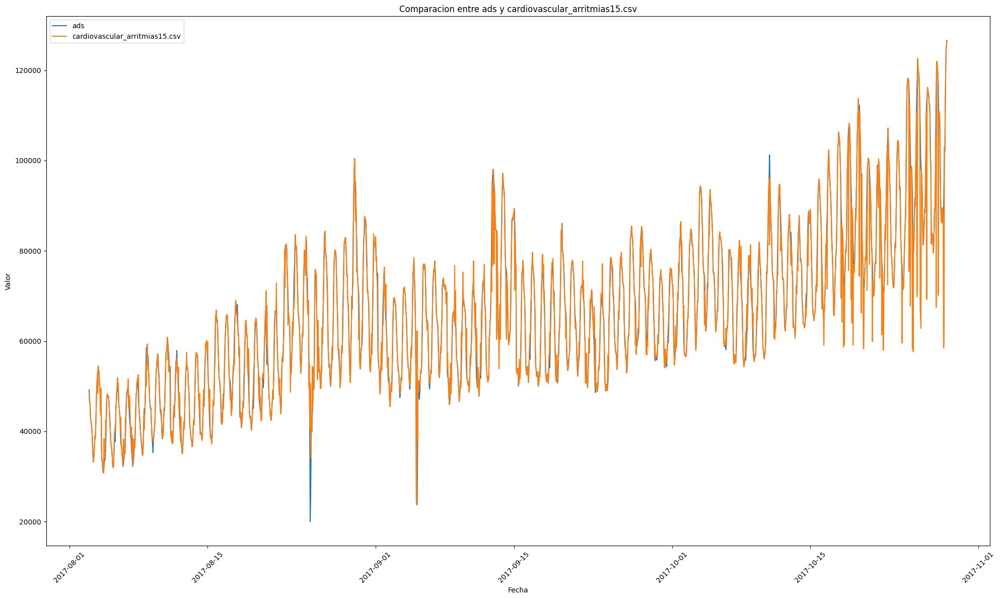

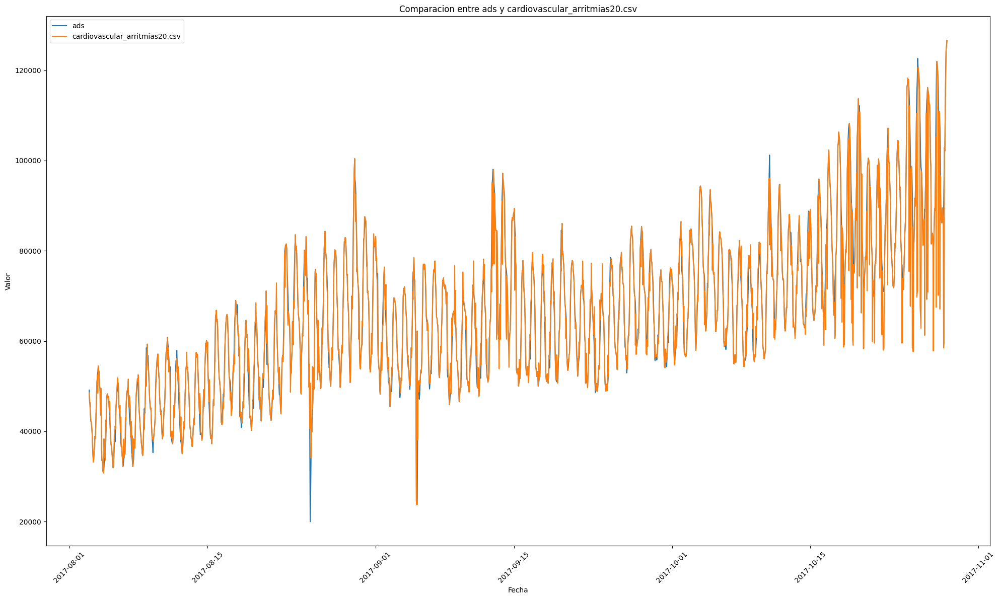

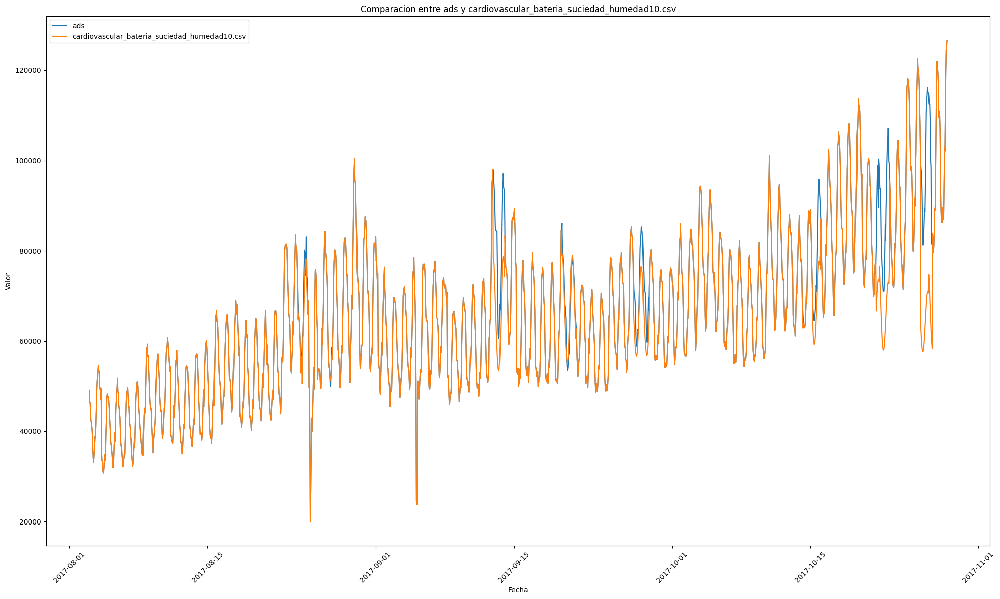

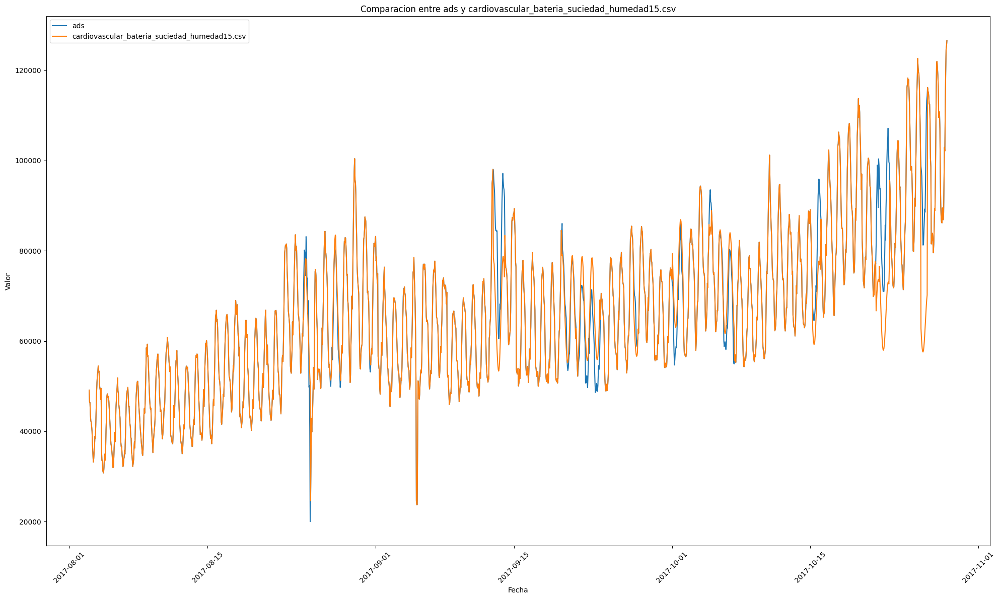

...

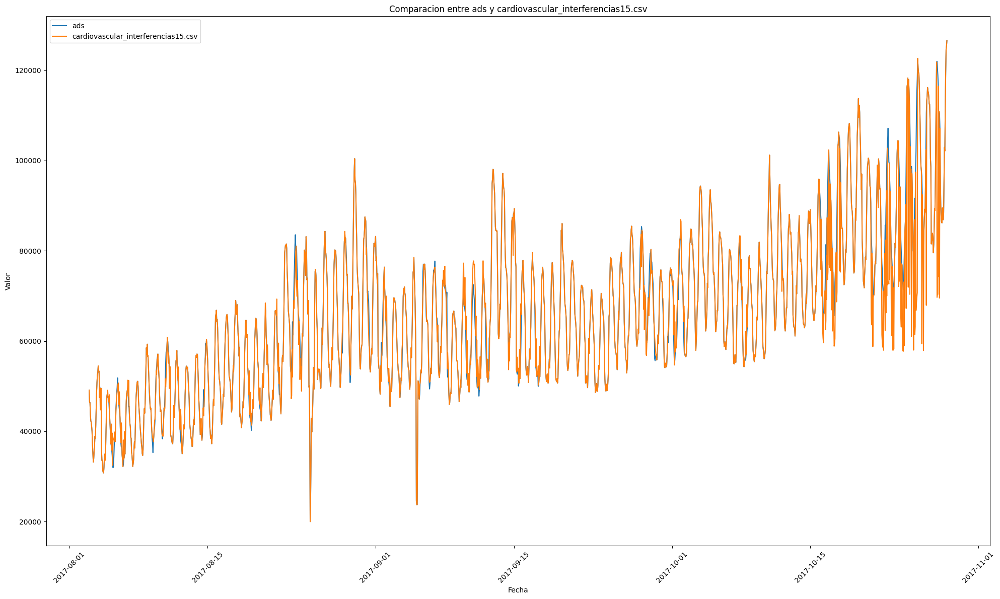

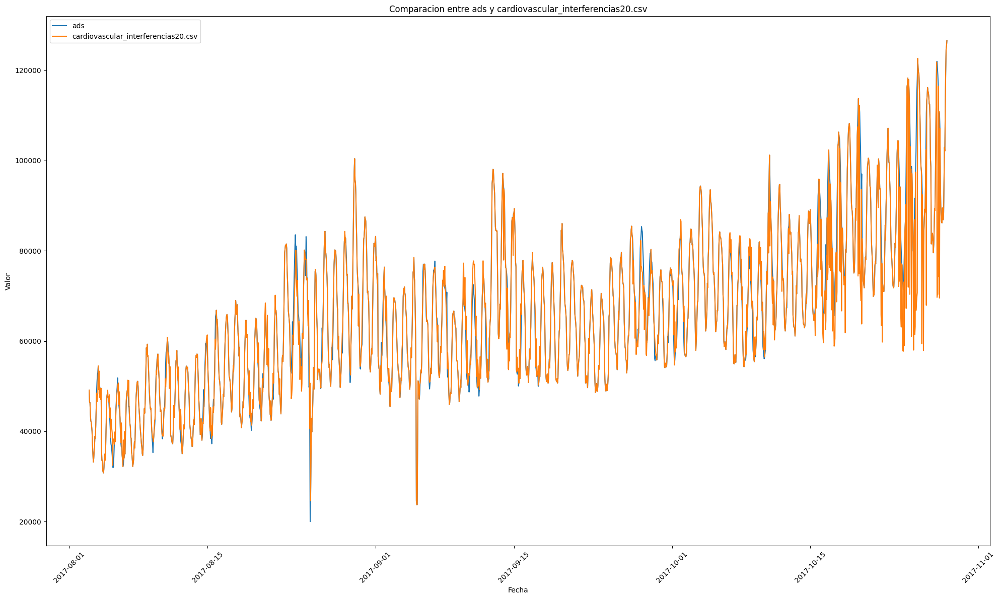

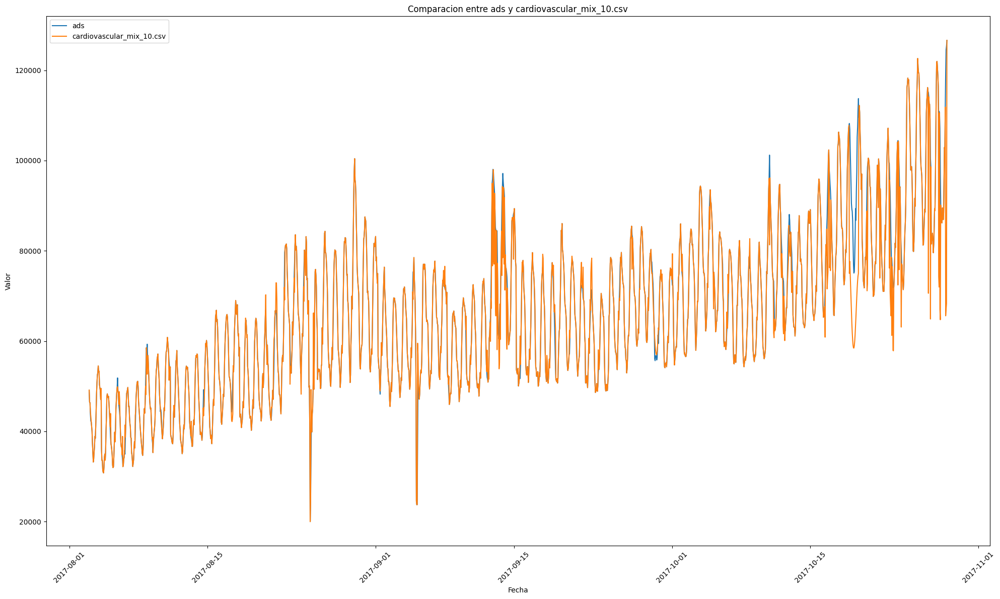

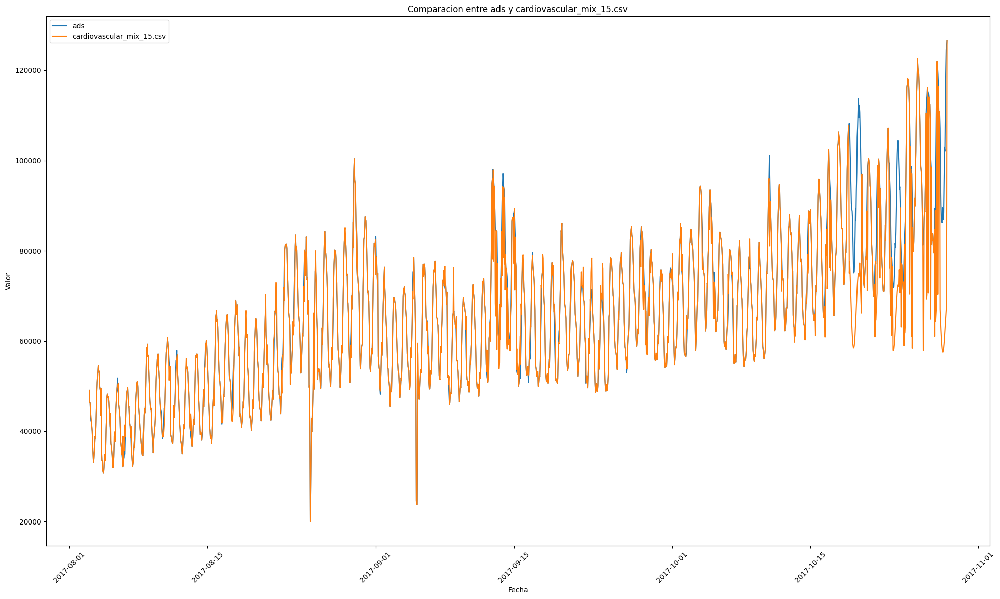

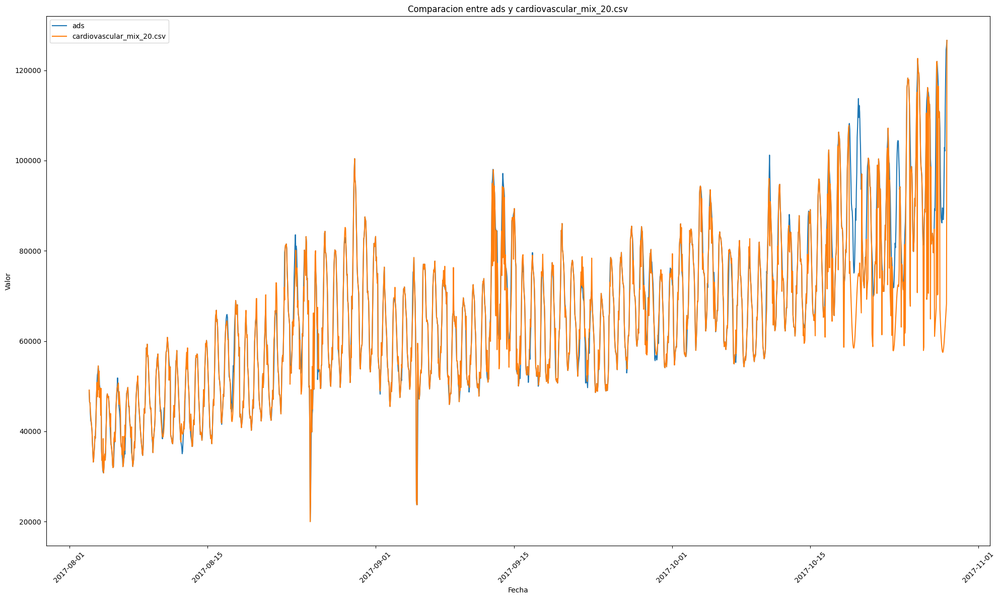

In [264]:
auxi.graficar_comparacion(serie_cardiovascular, lista_serie_recuperada_cardiovascular)

### Manchas solares

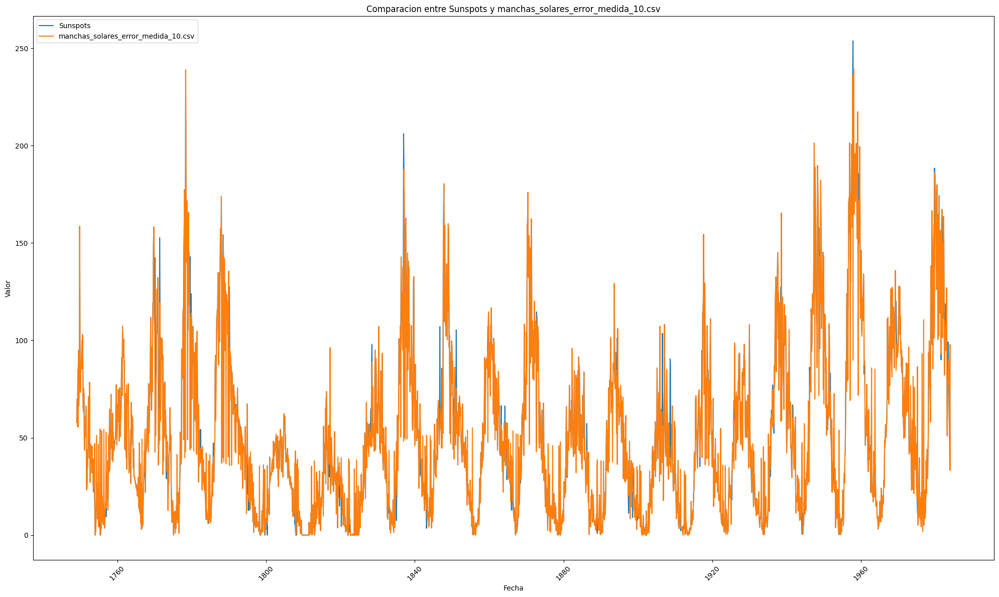

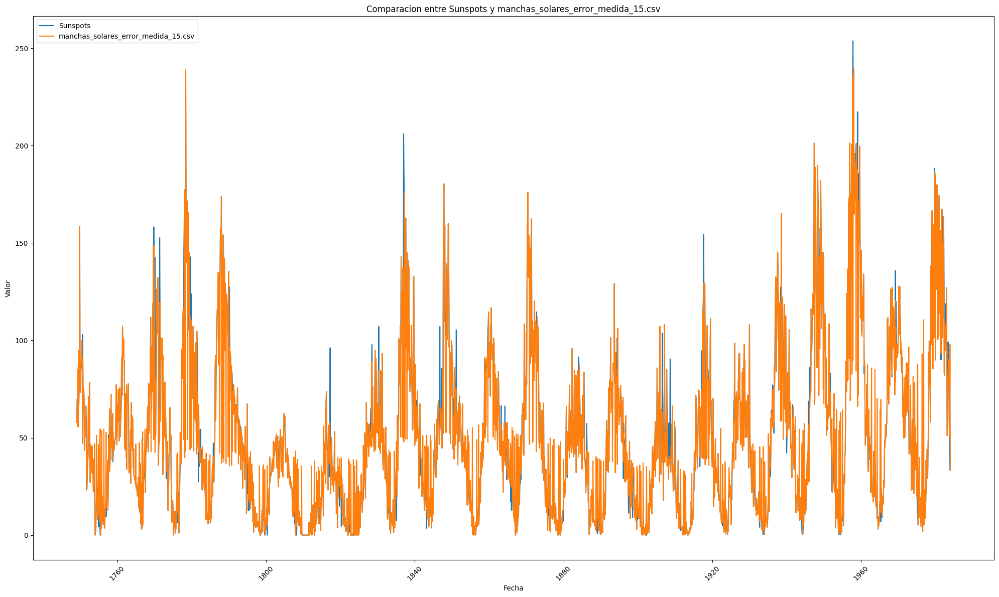

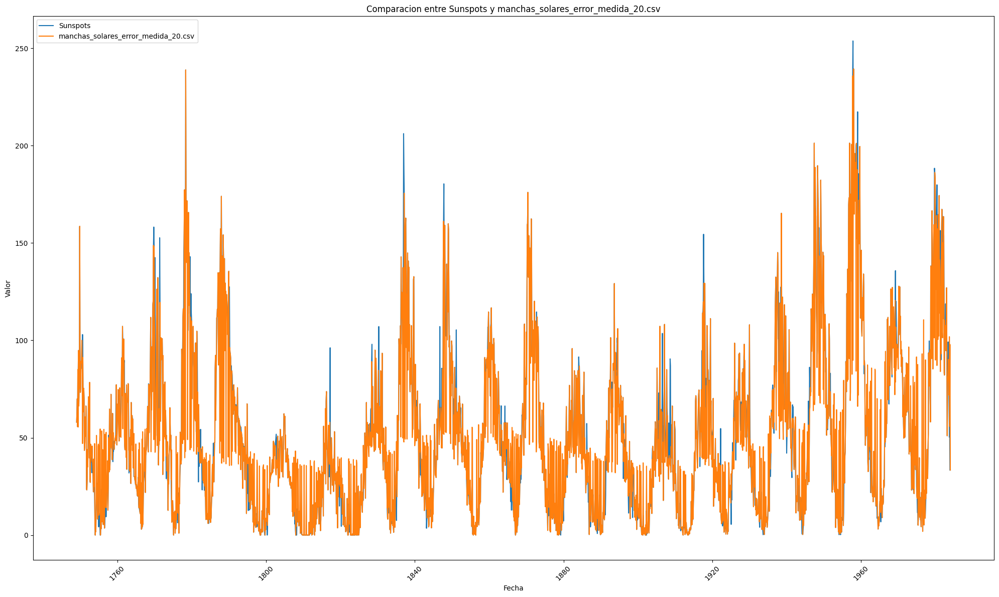

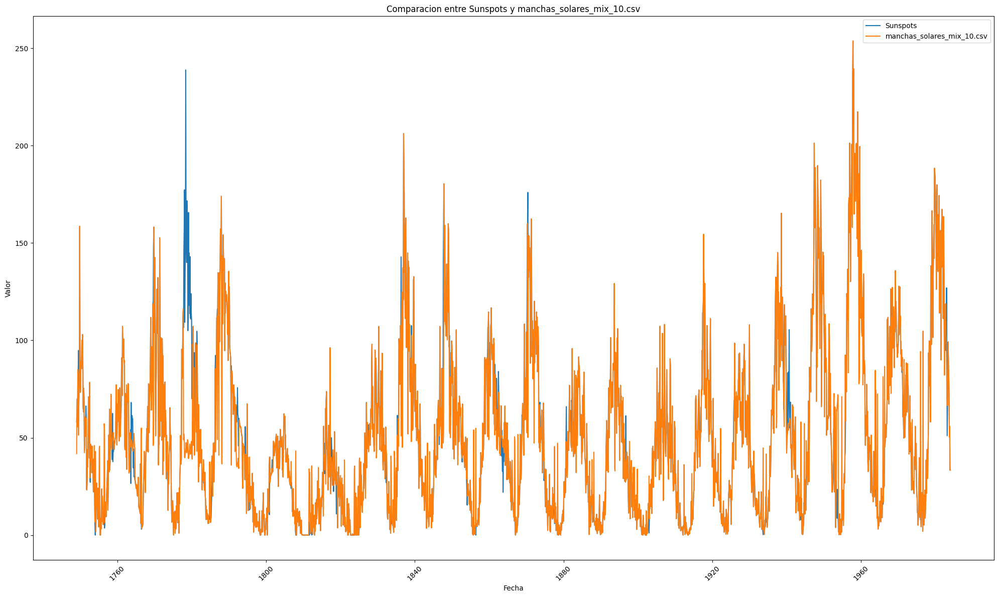

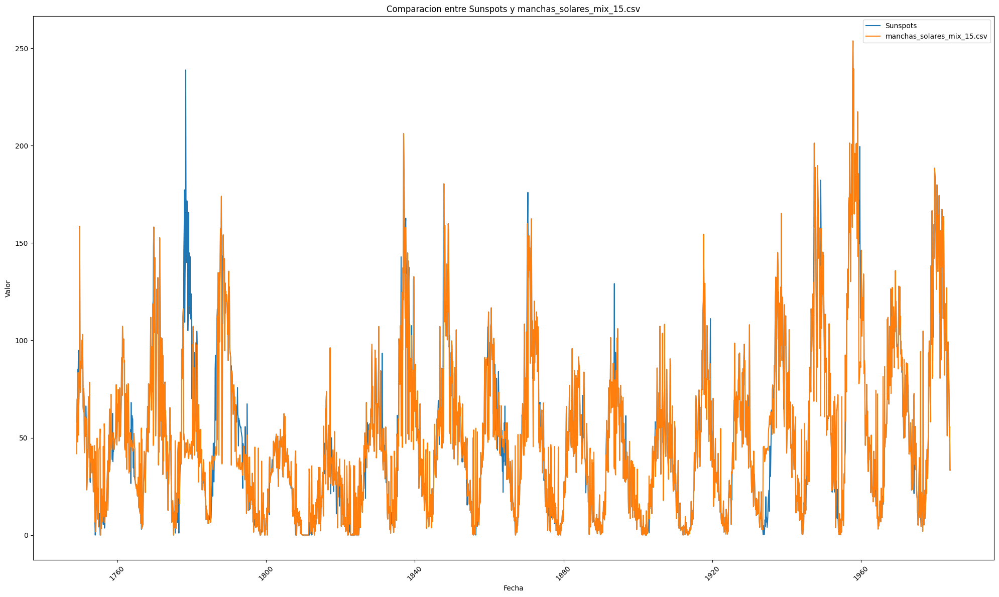

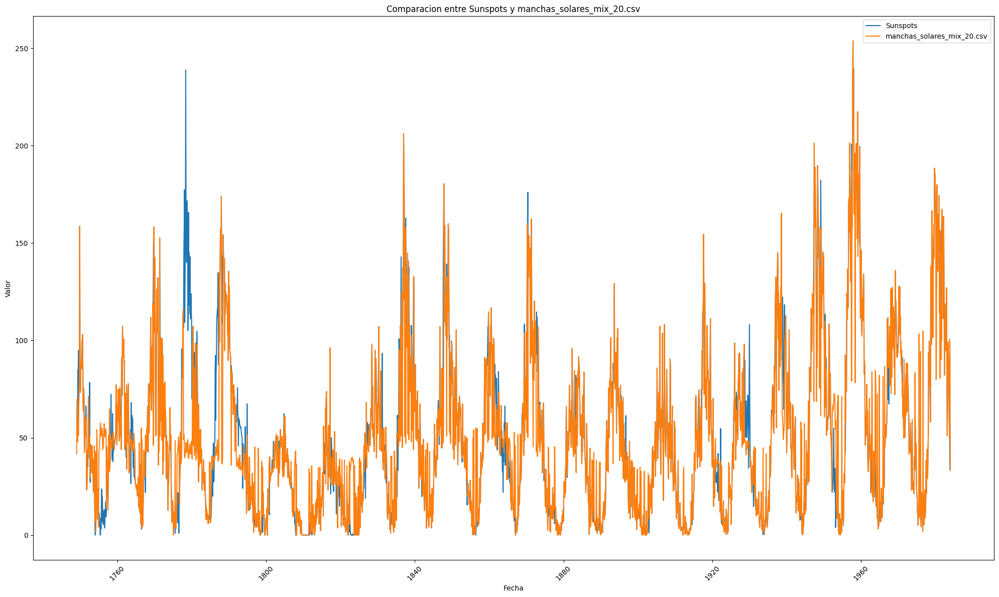

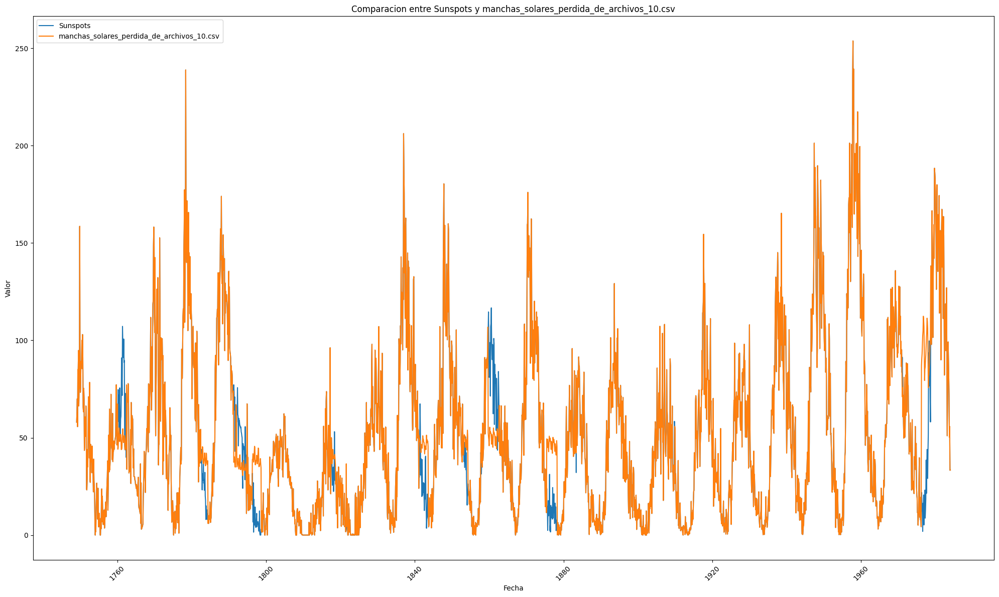

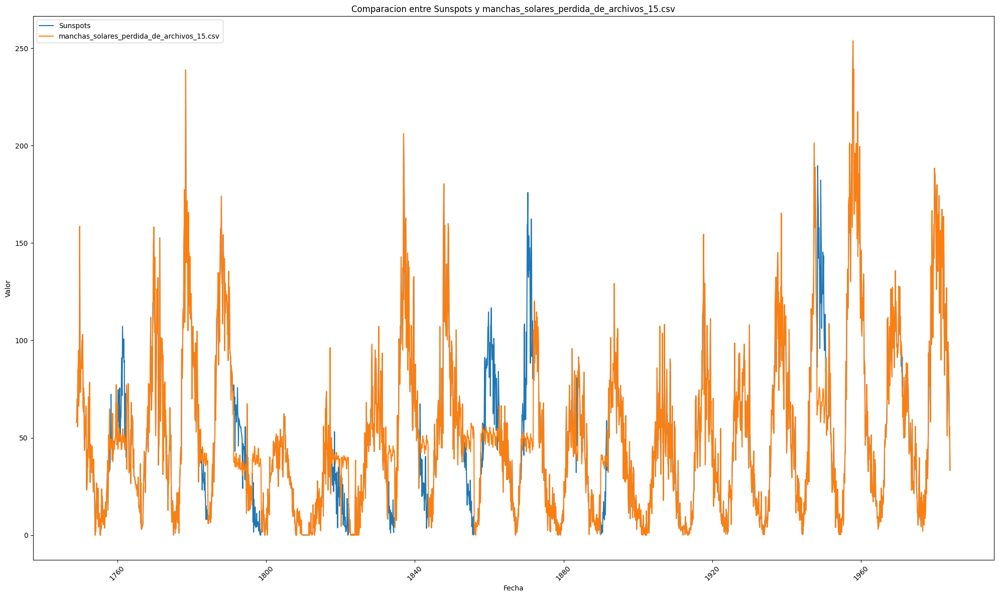

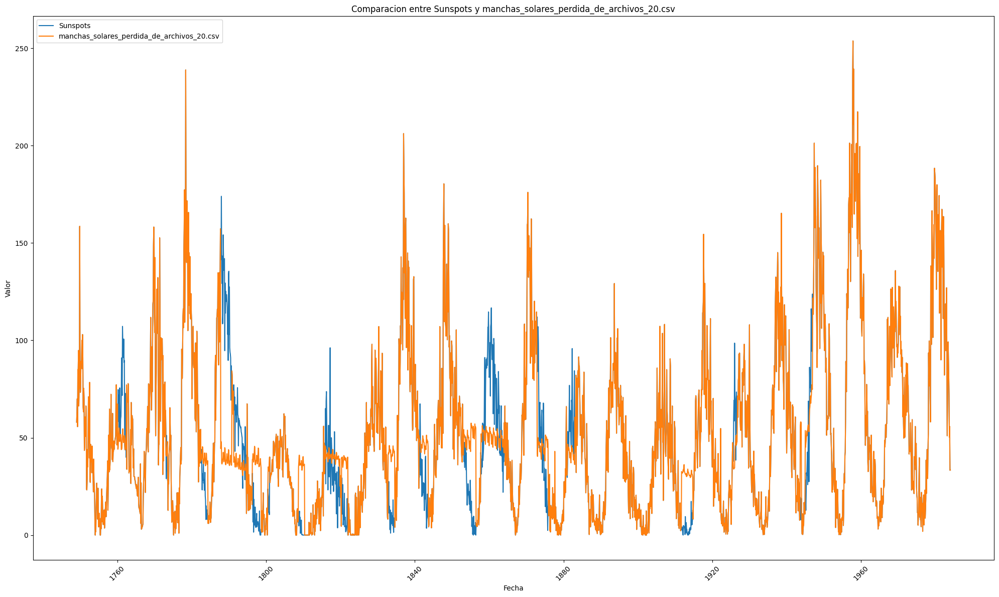

In [265]:
auxi.graficar_comparacion(serie_sunspots, lista_serie_recuperada_sunspots)

## Guardar datos

In [266]:
dataframe_general_imputada.to_csv("../svm/_dataframe_resultados.csv")
dataframe_general_imputada.to_csv("../svm/_dataframe_final_resultados.csv")
resultados_gridding_sunspots.to_csv("../svm/gridding/_gridding_sunspots.csv")
resultados_gridding_cardiovascular.to_csv("../svm/gridding/_gridding_cardiovascular.csv")
resultados_gridding_temperatura.to_csv("../svm/gridding/_gridding_temperatura.csv")
auxi.guardar_series("../svm/", lista_serie_recuperada_temperatura)
auxi.guardar_series("../svm/", lista_serie_recuperada_cardiovascular)
auxi.guardar_series("../svm/", lista_serie_recuperada_sunspots)